In [1]:
import numpy as np
import pandas as pd 

from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.utils import to_categorical
from keras import regularizers

In [2]:
#fixed random seed for reproducibility 
np.random.seed(0)

In [3]:
# load dataset (input variables = X, output variables = Y)
df = pd.read_csv("2.csv")

#count the number of occurances for each osID
OsID_counts = df['OsID'].value_counts()

#filter for osIDs that have 10 or more occurances
OsID_counts_filtered = OsID_counts[OsID_counts >= 10]

#assign a label for each osID 
OsID_labels = {}
class_no = 0
for osID in OsID_counts_filtered.index:
    OsID_labels[osID] = class_no
    class_no +=1

#filter the dataset with osID that contain 10 or more occurances
dataGene = df[df['OsID'].isin(OsID_counts_filtered.index)]

dataGene = dataGene.drop(['Class', 'Trait'],axis=1)

# Add a new column 'class' to the filtered dataset
dataGene['class'] = dataGene['OsID'].map(OsID_labels)

#print("Summary of dataGene:\n",dataGene.describe())

In [4]:
X = dataGene.drop(['class','OsID'], axis=1) # exclude class & OsID column
Y = dataGene['class']

#input feature names in order of descending importance scores in PCC feature selection method
feature_names = ['Root10DaysSeedling', 'Leaf45DaysOldPlant', 'Shoot10DaysSeedling', 'Shoot35DaysSeedling', 'Root35DaysSeedling', 
                 'Leaf21DaysSeedling', 'Root14DaysSeedling', 'Shoot3DaysSeedling', 'Root24DaysSeedling', 'Root52DaysSeedling', 
                 'Root17DaysSeedling', 'Root21DaysSeedling', 'Shoot14DaysSeedling', 'Shoot21DaysSeedling', 'Shoot17DaysSeedling',
                  'ET', 'PCC', 'log_2FoldChange', 'PPI', 'CoExpression']

X_fs = X.reindex(columns=feature_names)

print("Shape of X:\n",X_fs.shape)
print("Shape of Y:\n",Y.shape)

# Statistical summary of the variables
#print("Summary of X:\n",X_fs.describe())
#print("Summary of Y:\n",Y.describe())

# Check for class imbalance
print(df.groupby(Y).size())

# change both input and target variables datatype to ndarray

X_fs = X_fs.values # 2-D array

# select target variable 

Y = Y.values #1-D array
Y = Y.reshape(-1, 1)


Shape of X:
 (41110, 20)
Shape of Y:
 (41110,)
class
0.0      1800
1.0      1296
2.0      1260
3.0      1218
4.0      1026
5.0      1008
6.0       930
7.0       912
8.0       880
9.0       798
10.0      792
11.0      759
12.0      729
13.0      720
14.0      702
15.0      693
16.0      672
17.0      640
18.0      625
19.0      570
20.0      546
21.0      506
22.0      483
23.0      448
24.0      432
25.0      384
26.0      360
27.0      360
28.0      320
29.0      312
         ... 
343.0      12
344.0      12
345.0      12
346.0      12
347.0      12
348.0      12
349.0      12
350.0      12
351.0      12
352.0      12
353.0      12
354.0      12
355.0      11
356.0      11
357.0      11
358.0      11
359.0      11
360.0      11
361.0      10
362.0      10
363.0      10
364.0      10
365.0      10
366.0      10
367.0      10
368.0      10
369.0      10
370.0      10
371.0      10
372.0      10
Length: 373, dtype: int64


Class=0, n=1800 (4.378%)
Class=1, n=1296 (3.153%)
Class=2, n=1260 (3.065%)
Class=3, n=1218 (2.963%)
Class=4, n=1026 (2.496%)
Class=5, n=1008 (2.452%)
Class=6, n=930 (2.262%)
Class=7, n=912 (2.218%)
Class=8, n=880 (2.141%)
Class=9, n=798 (1.941%)
Class=10, n=792 (1.927%)
Class=11, n=759 (1.846%)
Class=12, n=729 (1.773%)
Class=13, n=720 (1.751%)
Class=14, n=702 (1.708%)
Class=15, n=693 (1.686%)
Class=16, n=672 (1.635%)
Class=17, n=640 (1.557%)
Class=18, n=625 (1.520%)
Class=19, n=570 (1.387%)
Class=20, n=546 (1.328%)
Class=21, n=506 (1.231%)
Class=22, n=483 (1.175%)
Class=23, n=448 (1.090%)
Class=24, n=432 (1.051%)
Class=25, n=384 (0.934%)
Class=26, n=360 (0.876%)
Class=27, n=360 (0.876%)
Class=28, n=320 (0.778%)
Class=29, n=312 (0.759%)
Class=30, n=312 (0.759%)
Class=31, n=306 (0.744%)
Class=32, n=304 (0.739%)
Class=33, n=299 (0.727%)
Class=34, n=297 (0.722%)
Class=35, n=296 (0.720%)
Class=36, n=280 (0.681%)
Class=37, n=264 (0.642%)
Class=38, n=260 (0.632%)
Class=39, n=253 (0.615%)
Clas

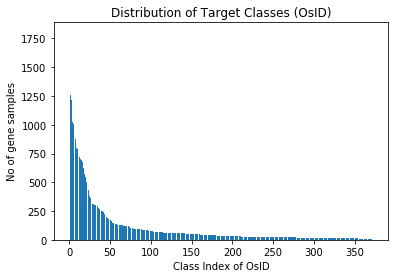

In [5]:
from collections import Counter
# summarize distribution
counter = Counter(Y.flatten())

# sort counter by keys
counter = dict(sorted(counter.items()))

for k,v in counter.items():
 per = v / len(Y.flatten()) * 100
 print('Class=%d, n=%d (%.3f%%)' % (k, v, per))
# plot the distribution
plt.bar( counter.keys(), counter.values())

plt.ylabel('No of gene samples')
plt.xlabel('Class Index of OsID')
plt.title('Distribution of Target Classes (OsID)')
plt.show()

In [6]:
def draw_confusion_matrix(cm):
    plt.figure(figsize=(12,8))
    sns.heatmap(cm,annot=True,fmt="d", center=0, cmap='autumn') 
    plt.title("Confusion Matrix")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

In [7]:
# prepare target data
def prepare_targets(y_train, y_test):
	le = LabelEncoder()
	
	#fit the encoders only to the training data and then transform both train and test data
	y_train_enc = le.fit_transform(y_train)
	y_test_enc = le.transform(y_test)

	return y_train_enc, y_test_enc

In [8]:
# define baseline model (MLP)
def MLP_model(input_dim):

    model = Sequential()
    model.add(Dense(60, input_dim=input_dim,bias_initializer='normal', activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(20,bias_initializer='normal',activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(20,bias_initializer='normal',activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(373,kernel_initializer='normal', activation='softmax')) #softmax for multi-class classification, num_classes = 373

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    return model

In [9]:
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_fs, Y, test_size=0.33, random_state=1)

# prepare output data
y_train_enc, y_test_enc = prepare_targets(y_train, y_test)

# Define the number of folds for k-fold cross-validation
k = 2

# Define the cross-validation method
cv_method = StratifiedKFold(n_splits=k)

# Initialize the list to store the history, train & validation(accuracy & loss) for each model
models = []
model_history = []
model_accuracy = []
model_train_acc = []
model_train_loss = []
model_val_acc = []
model_val_loss = []


for i in range(1,21):

    models_fold = []
    hist = []
    train_accuracy = []
    train_loss = []
    val_accuracy = []
    val_loss = []
    test_accuracy = []

    print("Number of input features:",i)

    # Select the input features from the input data
    X_train_selected = X_train[:, :i]
    X_test_selected = X_test[:, :i]

    # Loop over the folds
    for fold, (train_index, val_index) in enumerate(cv_method.split(X_train_selected, y_train)):

        print("Fold:", fold+1)

        # Split the data into train and validation sets using the current fold index
        X_train_fold  = X_train_selected[train_index]
        y_train_fold  = y_train[train_index]
        X_val_fold = X_train_selected[val_index]
        y_val_fold = y_train[val_index]

        # Prepare the target data
        y_train_fold_enc, y_val_fold_enc = prepare_targets(y_train_fold, y_val_fold)

        # build the model
        model = MLP_model(i)

        # Fit the model to the training data for the current fold
        history = model.fit(X_train_fold, to_categorical(y_train_fold_enc, num_classes=373), epochs=100, batch_size=5, verbose=1, validation_split = 0.33)
    
        # Evaluate the model on the validation data for the current fold
        val_scores = model.evaluate(X_val_fold, to_categorical(y_val_fold_enc, num_classes=373), verbose=0)
        val_accuracy.append(val_scores[1])
        val_loss.append(val_scores[0])

        # Evaluate the model on the test data for the current fold
        test_scores = model.evaluate(X_test_selected, to_categorical(y_test_enc, num_classes=373), verbose=0)
        test_accuracy.append(test_scores[1])

        # add the model to the list of models
        models_fold.append(model)
        hist.append(history)

        # store the training accuracy and loss for each fold
        train_accuracy.append(history.history['accuracy'])
        train_loss.append(history.history['loss'])
        
    # Calculate the average test and validation accuracy and loss across all folds
    avg_test_acc = sum(test_accuracy) / len(test_accuracy)
    avg_val_acc = sum(val_accuracy) / len(val_accuracy)
    avg_val_loss = sum(val_loss) / len(val_loss)

    # Print the average validation and test accuracy and loss
    print("Average Validation Accuracy:", avg_val_acc)
    print("Average Validation Loss:",avg_val_loss)
    print("Average Test Accuracy:", avg_test_acc)

    best_fold_index = test_accuracy.index(max(test_accuracy))
    model_accuracy.append(test_accuracy[best_fold_index])
    models.append(models_fold[best_fold_index])
    model_history.append(hist[best_fold_index])
    model_train_acc.append(train_accuracy[best_fold_index])
    model_train_loss.append(train_loss[best_fold_index])
    model_val_acc.append(val_accuracy[best_fold_index])
    model_val_loss.append(val_loss[best_fold_index])


    print("Final Test Accuracy for each fold:", test_accuracy[best_fold_index])

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated i

Number of input features: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dty

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 9s 3ms/step - loss: 4.3514 - accuracy: 0.1145 - val_loss: 3.8092 - val_accuracy: 0.1754
Epoch 2/100
1834/1834 [==============================] - 5s 3ms/step - loss: 3.4521 - accuracy: 0.2353 - val_loss: 3.4076 - val_accuracy: 0.2529
Epoch 3/100
1834/1834 [==============================] - 6s 3ms/step - loss: 3.1314 - accuracy: 0.3054 - val_loss: 3.1963 - val_accuracy: 0.2985
Epoch 4/100
1834/1834 [==============================] - 6s 3ms/step - loss: 2.9120 - accuracy: 0.3268 - val_loss: 3.0463 - val_accuracy: 0.3105
Epoch 5/100
1834/1834 [==============================] - 5s 3ms/step - loss: 2.7293 - accuracy: 0.3508 - val_loss: 2.8816 - val_accuracy: 0.3439
Epoch 6/100
1834/1834 [==============================] - 6s 3ms/step - loss: 2.5953 - accuracy: 0.3640 - val_loss: 2.7951 - val_accuracy: 0.3554
Epoch 7/100
1834/1834 [==============================] - 5s 3ms/step - loss: 2.4836 - accuracy: 0.3840 - val_loss: 2.6808 

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 13s 4ms/step - loss: 4.1879 - accuracy: 0.1725 - val_loss: 3.5377 - val_accuracy: 0.2963
Epoch 2/100
1834/1834 [==============================] - 7s 4ms/step - loss: 2.8624 - accuracy: 0.3910 - val_loss: 2.6958 - val_accuracy: 0.4785
Epoch 3/100
1834/1834 [==============================] - 7s 4ms/step - loss: 2.1388 - accuracy: 0.5404 - val_loss: 2.1613 - val_accuracy: 0.5786
Epoch 4/100
1834/1834 [==============================] - 8s 4ms/step - loss: 1.6917 - accuracy: 0.6119 - val_loss: 1.8774 - val_accuracy: 0.6098
Epoch 5/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.4253 - accuracy: 0.6487 - val_loss: 1.6447 - val_accuracy: 0.6643
Epoch 6/100
1834/1834 [==============================] - 6s 3ms/step - loss: 1.2534 - accuracy: 0.6830 - val_loss: 1.5451 - val_accuracy: 0.6678
Epoch 7/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.1349 - accuracy: 0.7033 - val_loss: 1.4695

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 14s 4ms/step - loss: 3.7318 - accuracy: 0.3065 - val_loss: 2.7973 - val_accuracy: 0.5091
Epoch 2/100
1834/1834 [==============================] - 7s 4ms/step - loss: 2.1136 - accuracy: 0.5752 - val_loss: 1.9844 - val_accuracy: 0.6260
Epoch 3/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.4846 - accuracy: 0.6766 - val_loss: 1.5668 - val_accuracy: 0.6977
Epoch 4/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.1523 - accuracy: 0.7252 - val_loss: 1.3301 - val_accuracy: 0.7261
Epoch 5/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.9662 - accuracy: 0.7523 - val_loss: 1.2543 - val_accuracy: 0.7376
Epoch 6/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8456 - accuracy: 0.7780 - val_loss: 1.1889 - val_accuracy: 0.7380
Epoch 7/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7702 - accuracy: 0.7928 - val_loss: 1.0456

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 13s 4ms/step - loss: 3.5772 - accuracy: 0.3390 - val_loss: 2.5165 - val_accuracy: 0.5554
Epoch 2/100
1834/1834 [==============================] - 6s 3ms/step - loss: 1.7683 - accuracy: 0.6639 - val_loss: 1.6553 - val_accuracy: 0.6783
Epoch 3/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.1250 - accuracy: 0.7662 - val_loss: 1.1935 - val_accuracy: 0.7675
Epoch 4/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8135 - accuracy: 0.8183 - val_loss: 0.9591 - val_accuracy: 0.7854
Epoch 5/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6560 - accuracy: 0.8434 - val_loss: 0.8181 - val_accuracy: 0.8361
Epoch 6/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5648 - accuracy: 0.8584 - val_loss: 0.7244 - val_accuracy: 0.8547
Epoch 7/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4993 - accuracy: 0.8701 - val_loss: 0.6791

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 14s 4ms/step - loss: 3.3497 - accuracy: 0.3825 - val_loss: 2.1271 - val_accuracy: 0.6271
Epoch 2/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.4099 - accuracy: 0.7309 - val_loss: 1.2733 - val_accuracy: 0.7538
Epoch 3/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8614 - accuracy: 0.8173 - val_loss: 0.9391 - val_accuracy: 0.8164
Epoch 4/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6303 - accuracy: 0.8487 - val_loss: 0.7677 - val_accuracy: 0.8439
Epoch 5/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5218 - accuracy: 0.8705 - val_loss: 0.7290 - val_accuracy: 0.8510
Epoch 6/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4608 - accuracy: 0.8829 - val_loss: 0.6565 - val_accuracy: 0.8689
Epoch 7/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4125 - accuracy: 0.8940 - val_loss: 0.6684

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/100
1834/1834 [==============================] - 13s 4ms/step - loss: 3.5673 - accuracy: 0.3230 - val_loss: 2.4505 - val_accuracy: 0.5837
Epoch 2/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.5521 - accuracy: 0.7171 - val_loss: 1.3263 - val_accuracy: 0.7755
Epoch 3/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8208 - accuracy: 0.8332 - val_loss: 0.9031 - val_accuracy: 0.8375
Epoch 4/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5299 - accuracy: 0.8786 - val_loss: 0.6956 - val_accuracy: 0.8738
Epoch 5/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4039 - accuracy: 0.9003 - val_loss: 0.6058 - val_accuracy: 0.8871
Epoch 6/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3327 - accuracy: 0.9160 - val_loss: 0.5348 - val_accuracy: 0.9088
Epoch 7/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2881 - accuracy: 0.9263 - val_loss: 0.4982 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/100
1834/1834 [==============================] - 13s 5ms/step - loss: 3.4917 - accuracy: 0.3520 - val_loss: 2.2504 - val_accuracy: 0.6550
Epoch 2/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.4859 - accuracy: 0.7265 - val_loss: 1.2934 - val_accuracy: 0.7892
Epoch 3/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.8407 - accuracy: 0.8339 - val_loss: 0.9388 - val_accuracy: 0.8452
Epoch 4/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5656 - accuracy: 0.8785 - val_loss: 0.7296 - val_accuracy: 0.8572
Epoch 5/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4352 - accuracy: 0.8999 - val_loss: 0.6404 - val_accuracy: 0.8789
Epoch 6/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3599 - accuracy: 0.9161 - val_loss: 0.5511 - val_accuracy: 0.8939
Epoch 7/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3174 - accuracy: 0.9225 - val_loss: 0.5076 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 13s 5ms/step - loss: 3.3287 - accuracy: 0.3922 - val_loss: 2.1281 - val_accuracy: 0.6076
Epoch 2/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.3185 - accuracy: 0.7469 - val_loss: 1.2007 - val_accuracy: 0.7899
Epoch 3/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.7386 - accuracy: 0.8441 - val_loss: 0.9025 - val_accuracy: 0.8299
Epoch 4/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.5094 - accuracy: 0.8867 - val_loss: 0.7052 - val_accuracy: 0.8773
Epoch 5/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3982 - accuracy: 0.9071 - val_loss: 0.6435 - val_accuracy: 0.8826
Epoch 6/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3351 - accuracy: 0.9162 - val_loss: 0.5625 - val_accuracy: 0.8986
Epoch 7/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2944 - accuracy: 0.9260 - val_loss: 0.4850

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 12s 4ms/step - loss: 3.5112 - accuracy: 0.3598 - val_loss: 2.2627 - val_accuracy: 0.6309
Epoch 2/100
1834/1834 [==============================] - 8s 4ms/step - loss: 1.4148 - accuracy: 0.7412 - val_loss: 1.2408 - val_accuracy: 0.7803
Epoch 3/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.7596 - accuracy: 0.8411 - val_loss: 0.8112 - val_accuracy: 0.8570
Epoch 4/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4961 - accuracy: 0.8897 - val_loss: 0.6516 - val_accuracy: 0.8946
Epoch 5/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3745 - accuracy: 0.9119 - val_loss: 0.5516 - val_accuracy: 0.9119
Epoch 6/100
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3068 - accuracy: 0.9259 - val_loss: 0.4949 - val_accuracy: 0.9012
Epoch 7/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.2629 - accuracy: 0.9355 - val_loss: 0.4628

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/100
1834/1834 [==============================] - 14s 5ms/step - loss: 3.3880 - accuracy: 0.3751 - val_loss: 2.2438 - val_accuracy: 0.6227
Epoch 2/100
1834/1834 [==============================] - 8s 5ms/step - loss: 1.4776 - accuracy: 0.7224 - val_loss: 1.3254 - val_accuracy: 0.7823
Epoch 3/100
1834/1834 [==============================] - 8s 5ms/step - loss: 0.8222 - accuracy: 0.8334 - val_loss: 0.9346 - val_accuracy: 0.8417
Epoch 4/100
1834/1834 [==============================] - 8s 5ms/step - loss: 0.5447 - accuracy: 0.8778 - val_loss: 0.7281 - val_accuracy: 0.8853
Epoch 5/100
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4152 - accuracy: 0.9030 - val_loss: 0.6339 - val_accuracy: 0.8944
Epoch 6/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3381 - accuracy: 0.9196 - val_loss: 0.5962 - val_accuracy: 0.8984
Epoch 7/100
1834/1834 [==============================] - 9s 5ms/step - loss: 0.2958 - accuracy: 0.9290 - val_loss: 0.5102 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/100
1834/1834 [==============================] - 13s 5ms/step - loss: 3.4856 - accuracy: 0.3682 - val_loss: 2.2514 - val_accuracy: 0.6081
Epoch 2/100
1834/1834 [==============================] - 8s 5ms/step - loss: 1.4326 - accuracy: 0.7300 - val_loss: 1.1906 - val_accuracy: 0.8043
Epoch 3/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.7513 - accuracy: 0.8396 - val_loss: 0.8508 - val_accuracy: 0.8439
Epoch 4/100
1834/1834 [==============================] - 8s 5ms/step - loss: 0.5049 - accuracy: 0.8852 - val_loss: 0.6651 - val_accuracy: 0.8935
Epoch 5/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3914 - accuracy: 0.9089 - val_loss: 0.6386 - val_accuracy: 0.8948
Epoch 6/100
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3205 - accuracy: 0.9208 - val_loss: 0.5560 - val_accuracy: 0.9068
Epoch 7/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.2792 - accuracy: 0.9317 - val_loss: 0.4971 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 13s 5ms/step - loss: 3.3403 - accuracy: 0.3965 - val_loss: 2.1002 - val_accuracy: 0.6200
Epoch 2/100
1834/1834 [==============================] - 8s 5ms/step - loss: 1.3007 - accuracy: 0.7514 - val_loss: 1.1797 - val_accuracy: 0.7839
Epoch 3/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.6928 - accuracy: 0.8594 - val_loss: 0.8510 - val_accuracy: 0.8448
Epoch 4/100
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4775 - accuracy: 0.8905 - val_loss: 0.6697 - val_accuracy: 0.8849
Epoch 5/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3659 - accuracy: 0.9158 - val_loss: 0.5483 - val_accuracy: 0.9012
Epoch 6/100
1834/1834 [==============================] - 9s 5ms/step - loss: 0.2972 - accuracy: 0.9269 - val_loss: 0.5126 - val_accuracy: 0.9183
Epoch 7/100
1834/1834 [==============================] - 9s 5ms/step - loss: 0.2573 - accuracy: 0.9371 - val_loss: 0.4422

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 9s 3ms/step - loss: 3.5137 - accuracy: 0.3552 - val_loss: 2.3134 - val_accuracy: 0.6008
Epoch 2/100
1834/1834 [==============================] - 5s 3ms/step - loss: 1.4333 - accuracy: 0.7237 - val_loss: 1.3461 - val_accuracy: 0.7529
Epoch 3/100
1834/1834 [==============================] - 5s 3ms/step - loss: 0.7741 - accuracy: 0.8405 - val_loss: 0.9194 - val_accuracy: 0.8459
Epoch 4/100
1834/1834 [==============================] - 5s 3ms/step - loss: 0.5148 - accuracy: 0.8852 - val_loss: 0.6882 - val_accuracy: 0.8818
Epoch 5/100
1834/1834 [==============================] - 5s 3ms/step - loss: 0.4038 - accuracy: 0.9069 - val_loss: 0.6049 - val_accuracy: 0.9030
Epoch 6/100
1834/1834 [==============================] - 5s 3ms/step - loss: 0.3387 - accuracy: 0.9193 - val_loss: 0.6058 - val_accuracy: 0.8682
Epoch 7/100
1834/1834 [==============================] - 5s 3ms/step - loss: 0.2896 - accuracy: 0.9290 - val_loss: 0.5034 

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 10s 3ms/step - loss: 3.1711 - accuracy: 0.4188 - val_loss: 1.9258 - val_accuracy: 0.6769
Epoch 2/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.1802 - accuracy: 0.7717 - val_loss: 1.1029 - val_accuracy: 0.7916
Epoch 3/100
1834/1834 [==============================] - 6s 3ms/step - loss: 0.6769 - accuracy: 0.8531 - val_loss: 0.7628 - val_accuracy: 0.8643
Epoch 4/100
1834/1834 [==============================] - 6s 3ms/step - loss: 0.4866 - accuracy: 0.8840 - val_loss: 0.6660 - val_accuracy: 0.8738
Epoch 5/100
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3811 - accuracy: 0.9085 - val_loss: 0.5494 - val_accuracy: 0.8966
Epoch 6/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3176 - accuracy: 0.9217 - val_loss: 0.4996 - val_accuracy: 0.9185
Epoch 7/100
1834/1834 [==============================] - 5s 3ms/step - loss: 0.2842 - accuracy: 0.9280 - val_loss: 0.4891

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 10s 4ms/step - loss: 3.1174 - accuracy: 0.4348 - val_loss: 1.8963 - val_accuracy: 0.6723
Epoch 2/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.1799 - accuracy: 0.7745 - val_loss: 1.1385 - val_accuracy: 0.7843
Epoch 3/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6755 - accuracy: 0.8545 - val_loss: 0.7901 - val_accuracy: 0.8676
Epoch 4/100
1834/1834 [==============================] - 6s 4ms/step - loss: 0.4656 - accuracy: 0.8931 - val_loss: 0.6345 - val_accuracy: 0.8968
Epoch 5/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3698 - accuracy: 0.9143 - val_loss: 0.6198 - val_accuracy: 0.8791
Epoch 6/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3115 - accuracy: 0.9246 - val_loss: 0.4764 - val_accuracy: 0.9167
Epoch 7/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.2800 - accuracy: 0.9309 - val_loss: 0.5159

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 11s 4ms/step - loss: 3.3996 - accuracy: 0.3520 - val_loss: 2.2810 - val_accuracy: 0.5817
Epoch 2/100
1834/1834 [==============================] - 8s 4ms/step - loss: 1.4123 - accuracy: 0.7318 - val_loss: 1.2710 - val_accuracy: 0.7465
Epoch 3/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7690 - accuracy: 0.8449 - val_loss: 0.8496 - val_accuracy: 0.8647
Epoch 4/100
1834/1834 [==============================] - 6s 3ms/step - loss: 0.5050 - accuracy: 0.8876 - val_loss: 0.6991 - val_accuracy: 0.8886
Epoch 5/100
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3763 - accuracy: 0.9104 - val_loss: 0.5809 - val_accuracy: 0.9035
Epoch 6/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3106 - accuracy: 0.9228 - val_loss: 0.5180 - val_accuracy: 0.9260
Epoch 7/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2622 - accuracy: 0.9345 - val_loss: 0.5195

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 6s 2ms/step - loss: 3.3314 - accuracy: 0.3721 - val_loss: 2.1290 - val_accuracy: 0.6127
Epoch 2/100
1834/1834 [==============================] - 4s 2ms/step - loss: 1.3472 - accuracy: 0.7507 - val_loss: 1.2372 - val_accuracy: 0.7983
Epoch 3/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.7579 - accuracy: 0.8472 - val_loss: 0.8929 - val_accuracy: 0.8603
Epoch 4/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.5007 - accuracy: 0.8900 - val_loss: 0.7138 - val_accuracy: 0.8840
Epoch 5/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.3745 - accuracy: 0.9164 - val_loss: 0.5848 - val_accuracy: 0.9094
Epoch 6/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.2973 - accuracy: 0.9324 - val_loss: 0.5313 - val_accuracy: 0.9205
Epoch 7/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.2516 - accuracy: 0.9400 - val_loss: 0.4480 

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 6s 2ms/step - loss: 3.3298 - accuracy: 0.3620 - val_loss: 2.0761 - val_accuracy: 0.6349
Epoch 2/100
1834/1834 [==============================] - 4s 2ms/step - loss: 1.3506 - accuracy: 0.7490 - val_loss: 1.1753 - val_accuracy: 0.8076
Epoch 3/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.7447 - accuracy: 0.8551 - val_loss: 0.8219 - val_accuracy: 0.8563
Epoch 4/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.4910 - accuracy: 0.8953 - val_loss: 0.6559 - val_accuracy: 0.8992
Epoch 5/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.3678 - accuracy: 0.9148 - val_loss: 0.5463 - val_accuracy: 0.9079
Epoch 6/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.2946 - accuracy: 0.9316 - val_loss: 0.5477 - val_accuracy: 0.9156
Epoch 7/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.2538 - accuracy: 0.9392 - val_loss: 0.4368 

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/100
1834/1834 [==============================] - 6s 3ms/step - loss: 3.3908 - accuracy: 0.3678 - val_loss: 2.0356 - val_accuracy: 0.6749
Epoch 2/100
1834/1834 [==============================] - 4s 2ms/step - loss: 1.2882 - accuracy: 0.7735 - val_loss: 1.0958 - val_accuracy: 0.8098
Epoch 3/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.6834 - accuracy: 0.8658 - val_loss: 0.7749 - val_accuracy: 0.8647
Epoch 4/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.4384 - accuracy: 0.9030 - val_loss: 0.5660 - val_accuracy: 0.9072
Epoch 5/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.3150 - accuracy: 0.9233 - val_loss: 0.5460 - val_accuracy: 0.8999
Epoch 6/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.2537 - accuracy: 0.9363 - val_loss: 0.4286 - val_accuracy: 0.9314
Epoch 7/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.2253 - accuracy: 0.9403 - val_loss: 0.4036 - val_ac

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 6s 2ms/step - loss: 3.6679 - accuracy: 0.2974 - val_loss: 2.4452 - val_accuracy: 0.5771
Epoch 2/100
1834/1834 [==============================] - 4s 2ms/step - loss: 1.5607 - accuracy: 0.7107 - val_loss: 1.3058 - val_accuracy: 0.7865
Epoch 3/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.8161 - accuracy: 0.8379 - val_loss: 0.8822 - val_accuracy: 0.8386
Epoch 4/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.5077 - accuracy: 0.8881 - val_loss: 0.6866 - val_accuracy: 0.8736
Epoch 5/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.3712 - accuracy: 0.9078 - val_loss: 0.6446 - val_accuracy: 0.8632
Epoch 6/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.2993 - accuracy: 0.9247 - val_loss: 0.4838 - val_accuracy: 0.9046
Epoch 7/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.2589 - accuracy: 0.9335 - val_loss: 0.4533 

In [10]:
#to show the no of input features and its corresponding model accuracy
model_list = []

#Iterate through each model's accuracy 
for i in range (len(model_accuracy)):
    #get the number of input features for the current model
    no_features = i + 1

    #round the model accuries to 3 d.p.
    rounded_model_acc = round(model_accuracy[i], 3)
    
    model_list.append([no_features, rounded_model_acc])

models_df = pd.DataFrame(model_list, columns=["No of input features", "Model accuracy"])

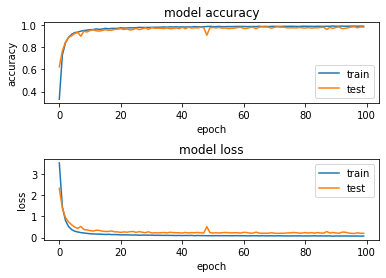

Final Test Accuracy: 0.9876907467842102


In [11]:
# Select the final model based on the max test accuracy across all models

best_model_index = model_accuracy.index(max(model_accuracy))

best_model = models[best_model_index]
best_model_history = model_history[best_model_index]
best_model_train_acc = model_train_acc[best_model_index]
best_model_train_loss = model_train_loss[best_model_index]
best_model_val_acc = model_val_acc[best_model_index]
best_model_val_loss = model_val_loss[best_model_index]

# summarize history for accuracy  
plt.subplot(211)  
plt.plot(best_model_history.history['accuracy'])  
plt.plot(best_model_history.history['val_accuracy'])  
plt.title('model accuracy')  
plt.ylabel('accuracy')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='lower right')  

# summarize history for loss
plt.subplot(212)  
plt.plot(best_model_history.history['loss'])  
plt.plot(best_model_history.history['val_loss'])  
plt.title('model loss')  
plt.ylabel('loss')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='upper right')  
plt.subplots_adjust(hspace=0.7)

plt.show() 

print("Final Test Accuracy:", model_accuracy[best_model_index])

In [12]:
#Select only the optimal number of input features for X_test
X_test = X_test[:,:(best_model_index+1)]

# Evaluate the best model on the test data
y_pred = best_model.predict(X_test)

# np.argmax() is used to convert the one-hot encoded predictions and test labels to class labels.
y_pred_label = np.argmax(y_pred, axis = 1)

# Print the classification report
print("Classification report:\n", classification_report(y_test_enc, y_pred_label))


424/424 [==============================] - 1s 1ms/step
Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       591
           1       1.00      1.00      1.00       430
           2       1.00      1.00      1.00       419
           3       1.00      1.00      1.00       384
           4       1.00      1.00      1.00       339
           5       1.00      1.00      1.00       342
           6       1.00      1.00      1.00       310
           7       1.00      1.00      1.00       325
           8       1.00      1.00      1.00       294
           9       1.00      1.00      1.00       269
          10       1.00      1.00      1.00       296
          11       1.00      1.00      1.00       258
          12       1.00      1.00      1.00       247
          13       1.00      1.00      1.00       237
          14       0.99      1.00      1.00       239
          15       1.00      1.00      1.00       235
  

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [13]:
# extract class labels from test data
class_test = y_test_enc

# Invert OsID_labels dictionary
inv_OsID_labels = {v: k for k, v in OsID_labels.items()}

# map OsID values to the class labels
OsID_test = [inv_OsID_labels.get(value, 'Unknown') for value in class_test]

# create dataframe with OsID, true class, predicted class, and true/false columns
results = pd.DataFrame({
    'OsID': OsID_test,
    'True Class': y_test_enc,
    'Predicted Class': y_pred_label,
    'True/False': class_test == y_pred_label
})

# display dataframe
print(results.head())

# save results_df to a CSV file
results.to_csv('MLP_gene classification.csv', index=False)

           OsID  True Class  Predicted Class  True/False
0  Os11g0704500         330              330        True
1  Os09g0279600         161              161        True
2  Os03g0669100          17               17        True
3  Os05g0542500          34               34        True
4  Os09g0522000           7                7        True
